<a href="https://colab.research.google.com/github/rahiakela/genai-research-and-practice/blob/main/gaig-layout-lm-v3/part_3_gaig_fine_tuning_layoutlmv3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup

**Reference**:

https://medium.com/@shivarama/layoutlmv3-from-zero-to-hero-part-3-16ae58291e9d


https://colab.research.google.com/drive/1Ce4H6r7PecaLbohqiGr8Uw-7zBn0-CVr?usp=share_link#scrollTo=GD6ugyXPMe_g


https://colab.research.google.com/github/NielsRogge/Transformers-Tutorials/blob/master/LayoutLMv2/FUNSD/True_inference_with_LayoutLMv2ForTokenClassification_%2B_Gradio_demo.ipynb


https://www.youtube.com/watch?v=bsT_1uDRQVo

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q datasets seqeval
!pip install accelerate -U

In [2]:
import torch
import numpy as np
import pandas as pd

from  PIL import Image
from PIL import ImageDraw, ImageFont

from datasets import load_dataset
from datasets.features import ClassLabel
from datasets import Features, Sequence, ClassLabel, Value, Array2D, Array3D
from datasets import load_metric

from transformers import AutoProcessor
from transformers import LayoutLMv3ForTokenClassification
from transformers import TrainingArguments, Trainer
from transformers.data.data_collator import default_data_collator
from transformers import AutoModelForTokenClassification

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!unzip dataset_layoutlm_v3.zip

## Load dataset

In [8]:
# this dataset uses the new Image feature :)
dataset = load_dataset("./dataset_layoutlm_v3.py", trust_remote_code=True)

Generating train split: 0 examples [00:00, ? examples/s]

{'id': 2, 'file_name': 'dc03d74d-page_1.png', 'tokens': ['73,962,999.00', '4-28-2023', '4-28-24'], 'bboxes': [[1127, 1829, 1342, 1865], [429, 834, 583, 865], [889, 830, 1034, 881]], 'ner_tags': [15, 10, 11]}
{'id': 23, 'file_name': '73cbce30-page_0.png', 'tokens': ['_Mega', 'Lab-Health', 'Care', 'Svc,', 'LLC', '2296', 'Opitz', 'Blvd,', 'Suite', '260', 'Woodbridge', '_', '22191', '05/27/2012', 'www.megalabservices.com', 'Medical', 'Laboratory', '850,000.00', '850,000.00', '450,000.00', '450,000.00', '1,200,000.00', '1,200,000.00'], 'bboxes': [[391, 1358, 459, 1381], [469, 1359, 605, 1380], [616, 1360, 675, 1380], [685, 1360, 730, 1381], [748, 1360, 798, 1381], [494, 1436, 556, 1456], [567, 1436, 632, 1461], [641, 1436, 700, 1460], [711, 1437, 774, 1457], [783, 1437, 828, 1458], [305, 1513, 494, 1541], [472, 1504, 495, 1558], [2023, 1520, 2097, 1542], [1038, 1594, 1183, 1622], [1624, 1599, 1966, 1622], [628, 1933, 723, 1955], [733, 1934, 867, 1960], [1369, 2727, 1510, 2753], [821, 2597, 

Generating test split: 0 examples [00:00, ? examples/s]

{'id': 7, 'file_name': 'a899f615-page_0.png', 'tokens': ['Dynamic', 'Engineering', 'Consultants', 'PC', 'Main', 'Street', 'Lake', 'Como', 'New', 'Jersey', '07719', 'Land', 'Development', 'Www.dynamicec.com', '04/01/2004', '$', '_51', 'milloin'], 'bboxes': [[449, 611, 586, 645], [600, 611, 787, 645], [801, 610, 989, 638], [1004, 610, 1049, 638], [615, 681, 677, 704], [689, 680, 768, 704], [259, 746, 326, 771], [338, 746, 422, 771], [282, 813, 342, 837], [352, 813, 443, 843], [1318, 811, 1413, 837], [700, 879, 768, 904], [782, 879, 971, 910], [454, 1076, 780, 1110], [678, 948, 845, 974], [633, 1217, 648, 1245], [681, 1209, 709, 1234], [728, 1209, 816, 1234]], 'ner_tags': [0, 0, 0, 0, 1, 1, 2, 2, 3, 3, 4, 8, 8, 5, 7, 15, 15, 15]}
{'id': 42, 'file_name': '5e4ad096-page_0.png', 'tokens': ['Gabriel', 'Roeder', 'Smith', '&', 'Company', 'Holdings', 'and', 'all', 'subsidiaries', 'One', 'Towne', 'Square', 'Suite', '800', 'Southfield,', 'MI', '48076', 'www.arsconsulting.com', '1962', 'Actuarial',

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['id', 'tokens', 'bboxes', 'ner_tags', 'image_path', 'image'],
        num_rows: 41
    })
    test: Dataset({
        features: ['id', 'tokens', 'bboxes', 'ner_tags', 'image_path', 'image'],
        num_rows: 5
    })
})

In [ ]:
dataset["train"].features

{'id': Value(dtype='string', id=None),
 'tokens': Sequence(feature=Value(dtype='string', id=None), length=-1, id=None),
 'bboxes': Sequence(feature=Sequence(feature=Value(dtype='int64', id=None), length=-1, id=None), length=-1, id=None),
 'ner_tags': Sequence(feature=ClassLabel(names=['APPLICANT_NAME', 'APPLICANT_ADDRESS', 'APPLICANT_CITY', 'APPLICANT_STATE', 'APPLICANT_ZIP', 'APPLICANT_WEBSITE_1', 'APPLICANT_WEBSITE_2', 'EST_DATE', 'NATURE_BUSINESS_BLANK_DESC', 'APPLICANT_COUNTRY', 'EFFECTIVE_DATE', 'EXPIRATION_DATE', 'REVENUE_CURRENT_YEAR', 'REVENUE_CURRENT_YEAR_DOMESTIC', 'REVENUE_CURRENT_YEAR_FOREIGN', 'REVENUE_PRIOR_YEAR', 'REVENUE_PRIOR_YEAR_DOMESTIC', 'REVENUE_PRIOR_YEAR_FOREIGN', 'REVENUE_NEXT_YEAR', 'REVENUE_NEXT_YEAR_DOMESTIC', 'REVENUE_NEXT_YEAR_FOREIGN'], id=None), length=-1, id=None),
 'image_path': Value(dtype='string', id=None),
 'image': Image(mode=None, decode=True, id=None)}

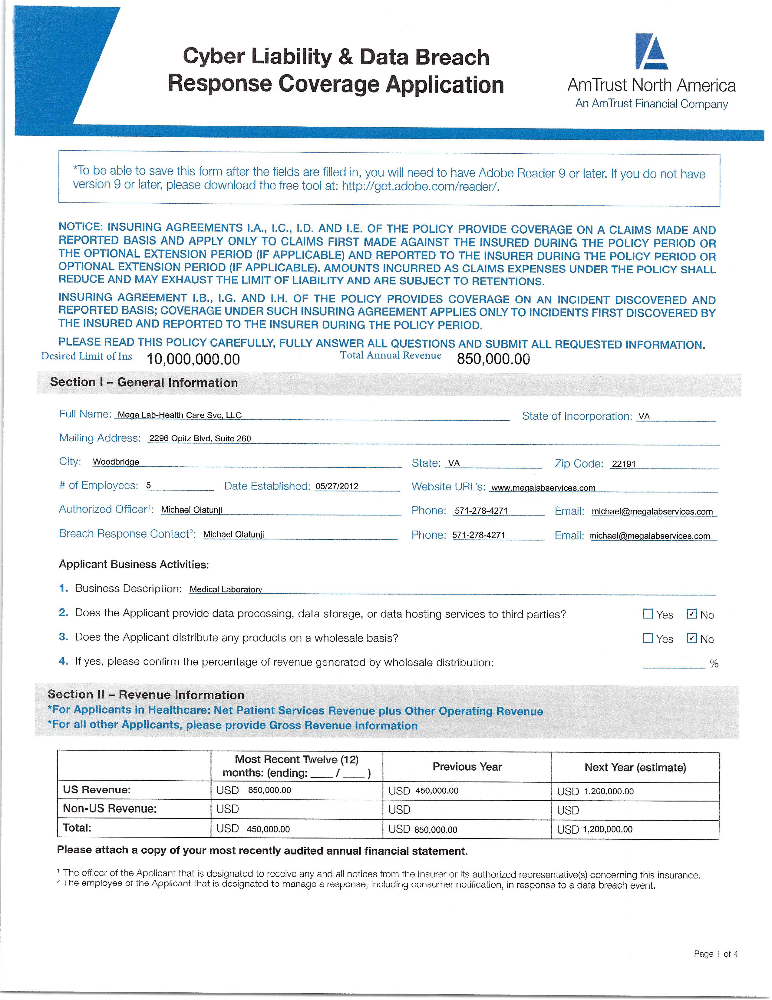

In [ ]:
# Inspect one of the annotated images
example = dataset["train"][1]
example["image"]

In [ ]:
sample_img = example["image"].convert("RGB")
sample_img.size

(2550, 3300)

In [ ]:
sample_img = Image.open(r"/content/dataset_layoutlm_v3/0dab5ca9-page_3.png").convert("RGB")
sample_img.size

(2550, 3300)

In [ ]:
words, boxes, ner_tags = example["tokens"], example["bboxes"], example["ner_tags"]
print(words)
print(boxes)
print(ner_tags)

['_Mega', 'Lab-Health', 'Care', 'Svc,', 'LLC', '2296', 'Opitz', 'Blvd,', 'Suite', '260', 'Woodbridge', '_', '22191', '05/27/2012', 'www.megalabservices.com', 'Medical', 'Laboratory', '850,000.00', '850,000.00', '450,000.00', '450,000.00', '1,200,000.00', '1,200,000.00']
[[153, 411, 180, 418], [183, 411, 237, 418], [241, 412, 264, 418], [268, 412, 286, 418], [293, 412, 312, 418], [193, 435, 218, 441], [222, 435, 247, 442], [251, 435, 274, 442], [278, 435, 303, 441], [307, 435, 324, 441], [119, 458, 193, 466], [185, 455, 194, 472], [793, 460, 822, 467], [407, 483, 463, 491], [636, 484, 770, 491], [246, 585, 283, 592], [287, 586, 340, 593], [536, 826, 592, 834], [321, 786, 376, 793], [538, 787, 593, 794], [320, 825, 375, 833], [755, 825, 819, 833], [757, 787, 820, 795]]
[0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 4, 7, 5, 8, 8, 15, 16, 12, 13, 18, 19]


## Load Tokenizer

In [ ]:
# we'll use the Auto API here - it will load LayoutLMv3Processor behind the scenes,
# based on the checkpoint we provide from the hub
processor = AutoProcessor.from_pretrained("microsoft/layoutlmv3-base", apply_ocr=False)

In [10]:
features = dataset["train"].features
column_names = dataset["train"].column_names
image_column_name = "image"
text_column_name = "tokens"
boxes_column_name = "bboxes"
label_column_name = "ner_tags"

In [11]:
# In the event the labels are not a `Sequence[ClassLabel]`, we will need to go through the dataset to get the unique labels.
def get_label_list(labels):
    unique_labels = set()
    for label in labels:
        unique_labels = unique_labels | set(label)
    label_list = list(unique_labels)
    label_list.sort()
    return label

In [12]:
if isinstance(features[label_column_name].feature, ClassLabel):
    label_list = features[label_column_name].feature.names
    # No need to convert the labels since they are already ints.
    id2label = {k: v for k,v in enumerate(label_list)}
    label2id = {v: k for k,v in enumerate(label_list)}
else:
    label_list = get_label_list(dataset["train"][label_column_name])
    id2label = {k: v for k,v in enumerate(label_list)}
    label2id = {v: k for k,v in enumerate(label_list)}
num_labels = len(label_list)

In [ ]:
print(label_list)

['APPLICANT_NAME', 'APPLICANT_ADDRESS', 'APPLICANT_CITY', 'APPLICANT_STATE', 'APPLICANT_ZIP', 'APPLICANT_WEBSITE_1', 'APPLICANT_WEBSITE_2', 'EST_DATE', 'NATURE_BUSINESS_BLANK_DESC', 'APPLICANT_COUNTRY', 'EFFECTIVE_DATE', 'EXPIRATION_DATE', 'REVENUE_CURRENT_YEAR', 'REVENUE_CURRENT_YEAR_DOMESTIC', 'REVENUE_CURRENT_YEAR_FOREIGN', 'REVENUE_PRIOR_YEAR', 'REVENUE_PRIOR_YEAR_DOMESTIC', 'REVENUE_PRIOR_YEAR_FOREIGN', 'REVENUE_NEXT_YEAR', 'REVENUE_NEXT_YEAR_DOMESTIC', 'REVENUE_NEXT_YEAR_FOREIGN']


In [ ]:
print(id2label)

{0: 'APPLICANT_NAME', 1: 'APPLICANT_ADDRESS', 2: 'APPLICANT_CITY', 3: 'APPLICANT_STATE', 4: 'APPLICANT_ZIP', 5: 'APPLICANT_WEBSITE_1', 6: 'APPLICANT_WEBSITE_2', 7: 'EST_DATE', 8: 'NATURE_BUSINESS_BLANK_DESC', 9: 'APPLICANT_COUNTRY', 10: 'EFFECTIVE_DATE', 11: 'EXPIRATION_DATE', 12: 'REVENUE_CURRENT_YEAR', 13: 'REVENUE_CURRENT_YEAR_DOMESTIC', 14: 'REVENUE_CURRENT_YEAR_FOREIGN', 15: 'REVENUE_PRIOR_YEAR', 16: 'REVENUE_PRIOR_YEAR_DOMESTIC', 17: 'REVENUE_PRIOR_YEAR_FOREIGN', 18: 'REVENUE_NEXT_YEAR', 19: 'REVENUE_NEXT_YEAR_DOMESTIC', 20: 'REVENUE_NEXT_YEAR_FOREIGN'}


## Tokenize dataset

In [13]:
def prepare_example(examples):
    images = examples[image_column_name]
    words = examples[text_column_name]
    boxes = examples[boxes_column_name]
    word_labels = examples[label_column_name]

    encoding = processor(
        images, words, boxes=boxes, word_labels=word_labels,
        padding="max_length",
        truncation=True
    )
    return encoding

In [14]:
# we need to define custom features for `set_format` (used later on) to work properly
features = Features({
    'pixel_values': Array3D(dtype="float32", shape=(3, 224, 224)),
    'input_ids': Sequence(feature=Value(dtype='int64')),
    'attention_mask': Sequence(Value(dtype='int64')),
    'bbox': Array2D(dtype="int64", shape=(512, 4)),
    'labels': Sequence(feature=Value(dtype='int64')),
})

train_dataset = dataset["train"].map(
    prepare_example,
    batched=True,
    remove_columns=column_names,
    features=features,
)
eval_dataset = dataset["test"].map(
    prepare_example,
    batched=True,
    remove_columns=column_names,
    features=features,
)

Map:   0%|          | 0/41 [00:00<?, ? examples/s]

Map:   0%|          | 0/5 [00:00<?, ? examples/s]

In [ ]:
train_dataset

Dataset({
    features: ['pixel_values', 'input_ids', 'attention_mask', 'bbox', 'labels'],
    num_rows: 41
})

In [ ]:
example = train_dataset[0]
processor.tokenizer.decode(example['input_ids'])

'<s> 73,962,999.00 4-28-2023 4-28-24</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>

In [15]:
train_dataset.set_format("torch")

In [ ]:
example = train_dataset[0]
for k, v in example.items():
  print(f"{k}\t >> {v.shape}")

pixel_values	 >> torch.Size([3, 224, 224])
input_ids	 >> torch.Size([512])
attention_mask	 >> torch.Size([512])
bbox	 >> torch.Size([512, 4])
labels	 >> torch.Size([512])


In [ ]:
eval_dataset

Dataset({
    features: ['pixel_values', 'input_ids', 'attention_mask', 'bbox', 'labels'],
    num_rows: 5
})

In [ ]:
processor.tokenizer.decode(eval_dataset[0]['input_ids'])

'<s> Dynamic Engineering Consultants PC Main Street Lake Como New Jersey 07719 Land Development Www.dynamicec.com 04/01/2004 $ _51 milloin</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pa

In [ ]:
for id, label in zip(train_dataset[0]["input_ids"], train_dataset[0]["labels"]):
  print(processor.tokenizer.decode([id]), label.item())

## Load Model

In [ ]:
metric = load_metric("seqeval")

return_entity_level_metrics = False

def compute_metrics(p):
    predictions, labels = p
    predictions = np.argmax(predictions, axis=2)

    # Remove ignored index (special tokens)
    true_predictions = [
        [label_list[p] for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]
    true_labels = [
        [label_list[l] for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]

    results = metric.compute(predictions=true_predictions, references=true_labels)
    if return_entity_level_metrics:
        # Unpack nested dictionaries
        final_results = {}
        for key, value in results.items():
            if isinstance(value, dict):
                for n, v in value.items():
                    final_results[f"{key}_{n}"] = v
            else:
                final_results[key] = value
        return final_results
    else:
        return {
            "precision": results["overall_precision"],
            "recall": results["overall_recall"],
            "f1": results["overall_f1"],
            "accuracy": results["overall_accuracy"],
        }

In [ ]:
model = LayoutLMv3ForTokenClassification.from_pretrained(
    "microsoft/layoutlmv3-base",
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

In [18]:
training_args = TrainingArguments(
    output_dir="./test",
    max_steps=1000,
    per_device_train_batch_size=2,
    per_device_eval_batch_size=2,
    learning_rate=1e-5,
    evaluation_strategy="steps",
    eval_steps=100,
    load_best_model_at_end=True,
    metric_for_best_model="f1"
)

In [19]:
# Initialize our Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    compute_metrics=compute_metrics,
    data_collator=default_data_collator,
    tokenizer=processor,
)

max_steps is given, it will override any value given in num_train_epochs


In [20]:
trainer.train()

Step,Training Loss,Validation Loss,Precision,Recall,F1,Accuracy
100,No log,1.211010,0.550000,0.366667,0.440000,0.746032
200,No log,0.499909,0.814815,0.733333,0.771930,0.873016
300,No log,0.375659,0.821429,0.766667,0.793103,0.873016
400,No log,0.352309,0.821429,0.766667,0.793103,0.873016
500,0.797900,0.360034,0.862069,0.833333,0.847458,0.888889
600,0.797900,0.361950,0.862069,0.833333,0.847458,0.888889
700,0.797900,0.352803,0.862069,0.833333,0.847458,0.888889
800,0.797900,0.350004,0.806452,0.833333,0.819672,0.904762
900,0.797900,0.338182,0.833333,0.833333,0.833333,0.904762
1000,0.072100,0.342312,0.833333,0.833333,0.833333,0.904762


TrainOutput(global_step=1000, training_loss=0.43499480056762696, metrics={'train_runtime': 421.8659, 'train_samples_per_second': 4.741, 'train_steps_per_second': 2.37, 'total_flos': 518429152410624.0, 'train_loss': 0.43499480056762696, 'epoch': 47.61904761904762})

In [21]:
trainer.evaluate()

{'eval_loss': 0.3600338101387024,
 'eval_precision': 0.8620689655172413,
 'eval_recall': 0.8333333333333334,
 'eval_f1': 0.847457627118644,
 'eval_accuracy': 0.8888888888888888,
 'eval_runtime': 0.7339,
 'eval_samples_per_second': 6.813,
 'eval_steps_per_second': 4.088,
 'epoch': 47.61904761904762}

## Store model on Drive

In [4]:
from google.colab import drive
from google.colab import files

In [22]:
!zip -r -j gaig_fine_tuned_layoutlmv3.zip /content/test/checkpoint-1000/*.*

  adding: config.json (deflated 64%)
  adding: merges.txt (deflated 53%)
  adding: model.safetensors (deflated 7%)
  adding: optimizer.pt (deflated 36%)
  adding: preprocessor_config.json (deflated 49%)
  adding: rng_state.pth (deflated 25%)
  adding: scheduler.pt (deflated 56%)
  adding: special_tokens_map.json (deflated 85%)
  adding: tokenizer_config.json (deflated 75%)
  adding: tokenizer.json (deflated 72%)
  adding: trainer_state.json (deflated 78%)
  adding: training_args.bin (deflated 51%)
  adding: vocab.json (deflated 59%)


In [5]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# store dataset and model to drive
!mv gaig_fine_tuned_layoutlmv3.zip /content/drive/MyDrive/model/
!mv dataset_layoutlm_v3.zip /content/drive/MyDrive/model/
!mv dataset_layoutlm_v3.py /content/drive/MyDrive/model/

In [6]:
# get dataset and model from drive
!cp /content/drive/MyDrive/model/gaig_fine_tuned_layoutlmv3.zip .
!cp /content/drive/MyDrive/model/dataset_layoutlm_v3.zip .
!cp /content/drive/MyDrive/model/dataset_layoutlm_v3.py .

In [ ]:
!unzip gaig_fine_tuned_layoutlmv3.zip -d gaig_fine_tuned_layoutlmv3
!unzip dataset_layoutlm_v3.zip

## Testing

In [25]:
model = AutoModelForTokenClassification.from_pretrained("gaig_fine_tuned_layoutlmv3")
processor = AutoProcessor.from_pretrained("gaig_fine_tuned_layoutlmv3", apply_ocr=False)

In [26]:
dataset = load_dataset("./dataset_layoutlm_v3.py", trust_remote_code=True)

In [27]:
features = dataset["train"].features
column_names = dataset["train"].column_names
image_column_name = "image"
text_column_name = "tokens"
boxes_column_name = "bboxes"
label_column_name = "ner_tags"

In [28]:
# In the event the labels are not a `Sequence[ClassLabel]`, we will need to go through the dataset to get the unique labels.
def get_label_list(labels):
    unique_labels = set()
    for label in labels:
        unique_labels = unique_labels | set(label)
    label_list = list(unique_labels)
    label_list.sort()
    return label

In [29]:
if isinstance(features[label_column_name].feature, ClassLabel):
    label_list = features[label_column_name].feature.names
    # No need to convert the labels since they are already ints.
    id2label = {k: v for k,v in enumerate(label_list)}
    label2id = {v: k for k,v in enumerate(label_list)}
else:
    label_list = get_label_list(dataset["train"][label_column_name])
    id2label = {k: v for k,v in enumerate(label_list)}
    label2id = {v: k for k,v in enumerate(label_list)}
num_labels = len(label_list)

In [30]:
example = dataset["test"][1]
print(example.keys())

dict_keys(['id', 'tokens', 'bboxes', 'ner_tags', 'image_path', 'image'])


In [31]:
image = example["image"]
words = example["tokens"]
boxes = example["bboxes"]
word_labels = example["ner_tags"]

encoding = processor(image, words, boxes=boxes, word_labels=word_labels, return_tensors="pt")
for k,v in encoding.items():
  print(k,v.shape)

input_ids torch.Size([1, 43])
attention_mask torch.Size([1, 43])
bbox torch.Size([1, 43, 4])
labels torch.Size([1, 43])
pixel_values torch.Size([1, 3, 224, 224])


In [32]:
with torch.no_grad():
  outputs = model(**encoding)

In [33]:
logits = outputs.logits
logits.shape

torch.Size([1, 43, 21])

In [34]:
predictions = logits.argmax(-1).squeeze().tolist()
print(predictions)

[10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 4, 3, 5, 5, 5, 5, 5, 5, 5, 5, 7, 8, 8, 8, 8, 8, 8, 15, 15, 12, 12, 10]


In [67]:
predictions = logits.argmax(-1).squeeze()
predictions

tensor([10,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  2,
         2,  2,  3,  4,  3,  5,  5,  5,  5,  5,  5,  5,  5,  7,  8,  8,  8,  8,
         8,  8, 15, 15, 12, 12, 10])

In [81]:
probabilities = softmax(logits.argmax(-1).squeeze())
# print(f"Score:{probabilities}")

confidence_score = np.argmax(probabilities, 0)
print(f"Score:{probabilities}")

Score:[3.17938097e-03 1.44343673e-07 1.44343673e-07 1.44343673e-07
 1.44343673e-07 1.44343673e-07 1.44343673e-07 1.44343673e-07
 1.44343673e-07 1.44343673e-07 1.44343673e-07 3.92366782e-07
 3.92366782e-07 3.92366782e-07 3.92366782e-07 3.92366782e-07
 3.92366782e-07 1.06656349e-06 1.06656349e-06 1.06656349e-06
 2.89922016e-06 7.88089749e-06 2.89922016e-06 2.14225004e-05
 2.14225004e-05 2.14225004e-05 2.14225004e-05 2.14225004e-05
 2.14225004e-05 2.14225004e-05 2.14225004e-05 1.58292057e-04
 4.30282423e-04 4.30282423e-04 4.30282423e-04 4.30282423e-04
 4.30282423e-04 4.30282423e-04 4.71861973e-01 4.71861973e-01
 2.34926243e-02 2.34926243e-02 3.17938097e-03]


In [ ]:
probabilities = softmax(outputs.logits.argmax(-1).squeeze().detach().numpy(), axis=1)
    print(f"Score:{probabilities}")
    confidence_score = np.argmax(probabilities, 0)

In [35]:
labels = encoding.labels.squeeze().tolist()
print(labels)

[-100, 0, 0, -100, 0, 0, 0, 0, 0, 0, 0, 1, 1, -100, 1, 1, 1, 2, -100, -100, 3, 4, -100, 5, -100, -100, -100, -100, -100, -100, -100, 7, 8, -100, -100, 8, 8, 8, 15, -100, 12, -100, -100]


In [36]:
def unnormalize_box(bbox, width, height):
     return [
         width * (bbox[0] / 1000),
         height * (bbox[1] / 1000),
         width * (bbox[2] / 1000),
         height * (bbox[3] / 1000),
     ]

token_boxes = encoding.bbox.squeeze().tolist()
width, height = image.size

true_predictions = [model.config.id2label[pred] for pred, label in zip(predictions, labels) if label != - 100]
true_labels = [model.config.id2label[label] for prediction, label in zip(predictions, labels) if label != -100]
true_boxes = [unnormalize_box(box, width, height) for box, label in zip(token_boxes, labels) if label != -100]

In [ ]:
true_predictions

In [ ]:
true_labels

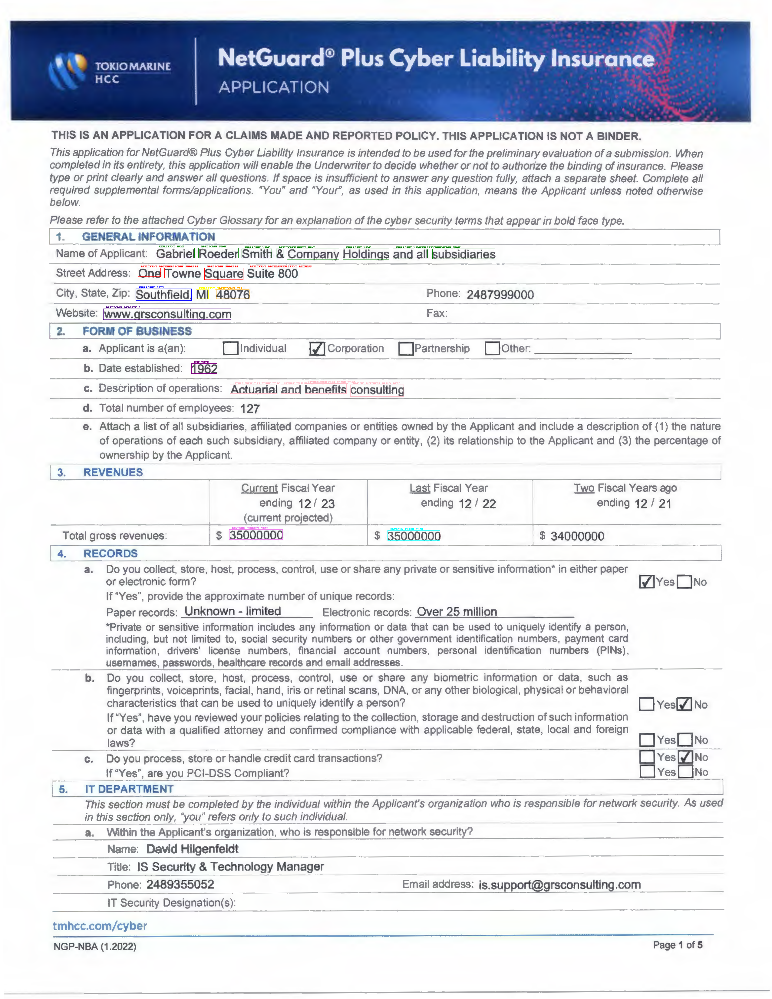

In [38]:
draw = ImageDraw.Draw(image)

font = ImageFont.load_default()

def iob_to_label(label):
    label = label
    if not label:
      return 'other'
    return label

label2color = {
	"APPLICANT_NAME": "green",
	"APPLICANT_ADDRESS": "red",
	"APPLICANT_CITY": "blue",
	"APPLICANT_STATE": "yellow",
	"APPLICANT_ZIP": "orange",
	"APPLICANT_WEBSITE_1": "indigo",
	"APPLICANT_WEBSITE_2": "violet",
	"EST_DATE": "purple",
	"NATURE_BUSINESS_BLANK_DESC": "pink",
	"APPLICANT_COUNTRY": "olive",
	"EFFECTIVE_DATE": "maroon",
	"EXPIRATION_DATE": "teal",
	"REVENUE_CURRENT_YEAR": "violet",
	"REVENUE_CURRENT_YEAR_DOMESTIC": "mauve",
	"REVENUE_CURRENT_YEAR_FOREIGN": "rust",
	"REVENUE_PRIOR_YEAR": "cyan",
	"REVENUE_PRIOR_YEAR_DOMESTIC": "bronze",
	"REVENUE_PRIOR_YEAR_FOREIGN": "navy",
	"REVENUE_NEXT_YEAR": "khaki",
	"REVENUE_NEXT_YEAR_DOMESTIC": "cobalt",
	"REVENUE_NEXT_YEAR_FOREIGN": "emerald"
}

for prediction, box in zip(true_predictions, true_boxes):
    predicted_label = iob_to_label(prediction)
    draw.rectangle(box, outline=label2color[predicted_label])
    draw.text((box[0] + 10, box[1] - 10), text=predicted_label, fill=label2color[predicted_label], font=font)

image

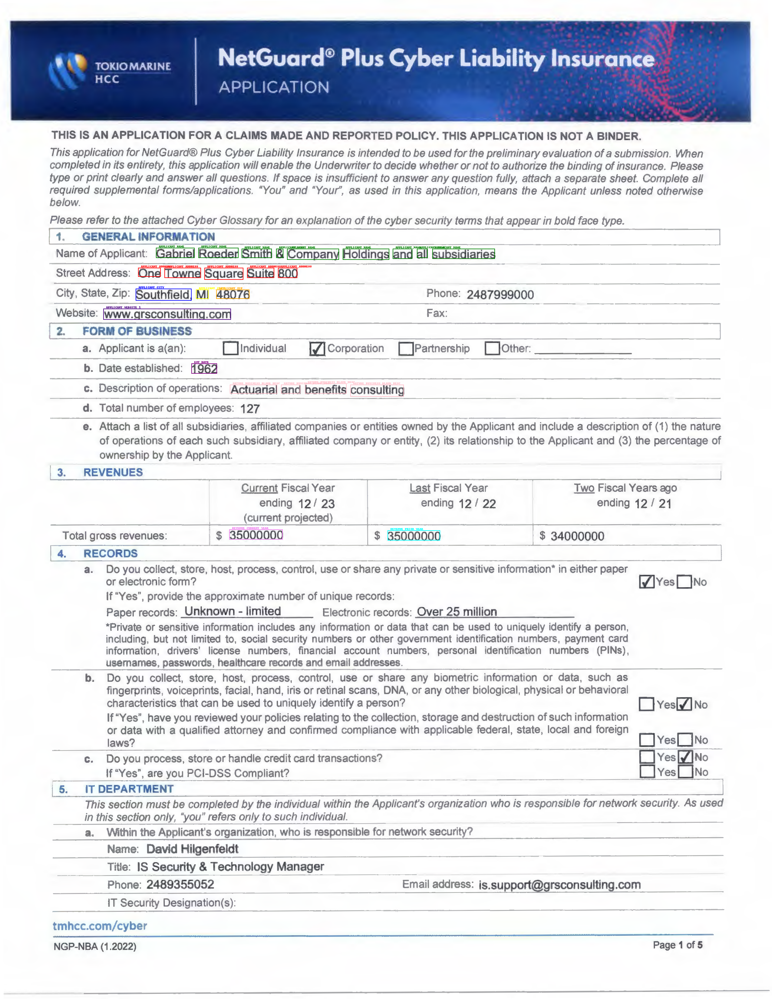

In [39]:
image = example["image"]
image = image.convert("RGB")

draw = ImageDraw.Draw(image)

json_data = {}

def create_json_data(key, val):
    if key in json_data:
      json_data[key] = json_data[key] + " " + val
    if key not in json_data:
      json_data[key] = val

for word, box, label in zip(example['tokens'], example['bboxes'], example['ner_tags']):
  actual_label = iob_to_label(id2label[label])
  # print(f"{actual_label}: {word}")
  create_json_data(actual_label, word)
  box = unnormalize_box(box, width, height)
  draw.rectangle(box, outline=label2color[actual_label], width=2)
  draw.text((box[0] + 10, box[1] - 10), actual_label, fill=label2color[actual_label], font=font)

image

In [40]:
print(json_data)

{'APPLICANT_NAME': 'Gabriel Roeder Smith & Company Holdings and all subsidiaries', 'APPLICANT_ADDRESS': 'One Towne Square Suite 800', 'APPLICANT_CITY': 'Southfield,', 'APPLICANT_STATE': 'MI', 'APPLICANT_ZIP': '48076', 'APPLICANT_WEBSITE_1': 'www.arsconsulting.com', 'EST_DATE': '1962', 'NATURE_BUSINESS_BLANK_DESC': 'Actuarial and benefits consulting', 'REVENUE_PRIOR_YEAR': '35000000', 'REVENUE_CURRENT_YEAR': '35000000'}


## Run inference

In [ ]:
!pip install pytesseract

In [ ]:
!sudo apt-get install tesseract-ocr

In [8]:
import pytesseract
pytesseract.pytesseract.tesseract_cmd = (r'/usr/bin/tesseract')

In [51]:
from scipy.special import softmax

In [65]:
# load model and processor from huggingface hub
model = AutoModelForTokenClassification.from_pretrained("gaig_fine_tuned_layoutlmv3")
processor = AutoProcessor.from_pretrained("gaig_fine_tuned_layoutlmv3", apply_ocr=True)


# helper function to unnormalize bboxes for drawing onto the image
def unnormalize_box(bbox, width, height):
    return [
        width * (bbox[0] / 1000),
        height * (bbox[1] / 1000),
        width * (bbox[2] / 1000),
        height * (bbox[3] / 1000),
    ]


label2color = {
	"APPLICANT_NAME": "green",
	"APPLICANT_ADDRESS": "red",
	"APPLICANT_CITY": "blue",
	"APPLICANT_STATE": "yellow",
	"APPLICANT_ZIP": "orange",
	"APPLICANT_WEBSITE_1": "indigo",
	"APPLICANT_WEBSITE_2": "violet",
	"EST_DATE": "purple",
	"NATURE_BUSINESS_BLANK_DESC": "pink",
	"APPLICANT_COUNTRY": "olive",
	"EFFECTIVE_DATE": "maroon",
	"EXPIRATION_DATE": "teal",
	"REVENUE_CURRENT_YEAR": "violet",
	"REVENUE_CURRENT_YEAR_DOMESTIC": "mauve",
	"REVENUE_CURRENT_YEAR_FOREIGN": "rust",
	"REVENUE_PRIOR_YEAR": "cyan",
	"REVENUE_PRIOR_YEAR_DOMESTIC": "bronze",
	"REVENUE_PRIOR_YEAR_FOREIGN": "navy",
	"REVENUE_NEXT_YEAR": "khaki",
	"REVENUE_NEXT_YEAR_DOMESTIC": "cobalt",
	"REVENUE_NEXT_YEAR_FOREIGN": "emerald"
}

# draw results onto the image
def draw_boxes(image, boxes, predictions):
    width, height = image.size
    normalizes_boxes = [unnormalize_box(box, width, height) for box in boxes]

    # draw predictions over the image
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()
    for prediction, box in zip(predictions, normalizes_boxes):
        if prediction == "O":
            continue
        draw.rectangle(box, outline="black")
        draw.rectangle(box, outline=label2color[prediction])
        draw.text((box[0] + 10, box[1] - 10), text=prediction, fill=label2color[prediction], font=font)
    return image


# run inference
def run_inference(path, model=model, processor=processor, output_image=True):
    # create model input
    image = Image.open(path).convert("RGB")
    # image = image.resize(512)
    encoding = processor(image, return_offsets_mapping=True, return_tensors="pt", padding=True, truncation = True)
    offset_mapping = encoding.pop('offset_mapping')
    # del encoding["image"]
    # run inference
    outputs = model(**encoding)
    predictions = outputs.logits.argmax(-1).squeeze().tolist()
    probabilities = softmax(outputs.logits.argmax(-1).squeeze().detach().numpy(), axis=1)
    print(f"Score:{probabilities}")
    confidence_score = np.argmax(probabilities, 0)
    print(f"Score:{confidence_score}")
    # get labels
    labels = [model.config.id2label[prediction] for prediction in predictions]
    if output_image:
        return draw_boxes(image, encoding["bbox"][0], labels)
    else:
        return labels


def run_inference2(path, model=model, processor=processor, output_image=True):
    # create model input
    image = Image.open(path).convert("RGB")
    encoding = processor(image, return_offsets_mapping=True, return_tensors="pt", model_max_length=512 , padding=True, truncation = True)
    offset_mapping = encoding.pop('offset_mapping')

    # run inference
    # Ensure position_ids are within the valid range
    input_ids = encoding['input_ids']
    bbox = encoding['bbox']
    attention_mask = encoding['attention_mask']

    # Assuming position_ids should be a sequence of integers from 0 to the length of input_ids
    position_ids = torch.arange(input_ids.shape[1]).unsqueeze(0).to(input_ids.device)

    outputs = model(input_ids=input_ids, bbox=bbox, attention_mask=attention_mask, position_ids=position_ids)
    # outputs = model(**encoding)
    predictions = outputs.logits.argmax(-1).squeeze().tolist()
    # get labels
    labels = [model.config.id2label[prediction] for prediction in predictions]
    if output_image:
        return draw_boxes(image, encoding["bbox"][0], labels)
    else:
        return labels

In [27]:
dataset["test"][1]["image_path"]

'./dataset_layoutlm_v3/5e4ad096-page_0.png'

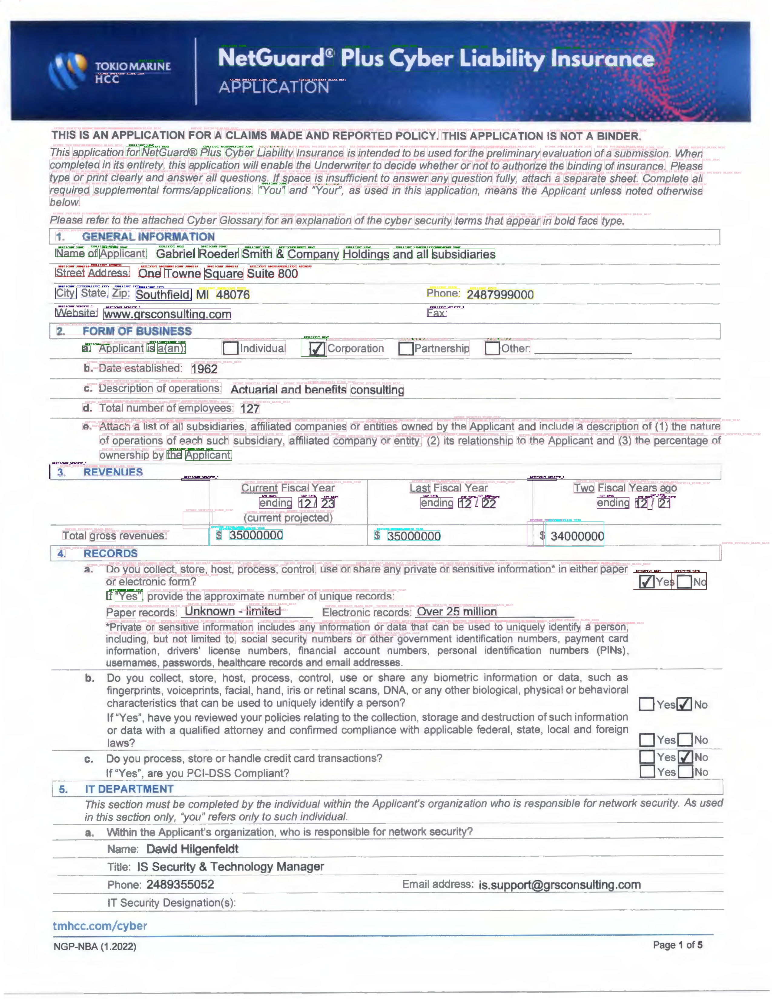

In [24]:
run_inference(dataset["test"][1]["image_path"])

In [63]:
p_labels = run_inference(dataset["test"][1]["image_path"], output_image=False)
print(p_labels)

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:1102: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


AxisError: axis 1 is out of bounds for array of dimension 1